In [1]:
import os
import re
from PIL import Image
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchinfo import summary
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import torchvision.models as models
import torchvision.utils
import pytorch_lightning as pl
import torchmetrics
from sklearn.metrics import classification_report, confusion_matrix
from pytorch_lightning.loggers import TensorBoardLogger
from tqdm import tqdm
from typing import Optional
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
imageDir = 'Images'
cleanedData = pd.read_csv('imageNtarget.csv')
cleanedData

,imageId,target
0,185029.jpg,1
1,154445.jpg,1
2,081551.jpg,1
3,184097.jpg,0
4,081330.jpg,1
...,...,...
4995,038684.jpg,0
4996,051742.jpg,1
4997,091853.jpg,0
4998,061556.jpg,1


In [3]:
def invNormalize(img):
    image = img.numpy().transpose((1,2,0))
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

def visPreds(predictionList, out):
    plt.figure(figsize=(10,11))
    className = ['Female', 'Male']
    arr = np.array(predictionList)
    arrImage = arr[0][0]
    arrPreds = arr[0][1]
    arrTarget = arr[0][2]
    arrProbs = arr[0][3]
    for k in range(out):
        ax = plt.subplot(3, 3, k+1)
        plt.title(f'Real class {className[int(arrTarget[k])]}\nPredicted class {className[int(arrPreds[k])]}\nPrediction confidence {float(arrProbs[k]):.2f}')
        plt.axis('off')
        plt.imshow(invNormalize(arrImage[k]))
        
def visFalsePreds(predictionList):
    plt.figure(figsize=(15, 15))
    className = ['Female', 'Male']
    arr = np.array(predictionList)
    imagesArr = arr[:, 0]
    targetArr = arr[:, 1]
    predsArr = arr[:, 2]
    probsArr = arr[:, 3]
    imagesList = [images for batch in imagesArr for images in batch]
    targetList = [target for batch in targetArr for target in batch]
    predsList = [preds for batch in predsArr for preds in batch]
    probsList = [probs for batch in probsArr for probs in batch]
    falsePreds = [i for i, (target, pred) in enumerate(zip(targetList, predsList)) if target != pred]
    if not falsePreds:
        print('No false prediction')
    else:
        print(falsePreds)
        numFalse = len(falsePreds)
        for i, falseIndex in enumerate(falsePreds):
            ax = plt.subplot(3, 3, i+1)
            plt.title(f'Real class {className[int(targetList[falseIndex])]}\nPredicted class {className[int(predsList[falseIndex])]}\nPrediction confidence {float(probsList[falseIndex]):2f}')
            plt.axis('off')
            plt.imshow(invNormalize(imagesList[falseIndex]))
            
def getReport(predictionList):
    className = ['Female', 'Male']
    arr = np.array(predictionList)
    targetArr = arr[:, 1]
    predsArr = arr[:, 2]
    targetList = [target[0].item() for batch in targetArr for target in batch]
    predsList = [pred[0].item() for batch in predsArr for pred in batch]
    print(classification_report(targetList, predsList, target_names=className))
    cm = confusion_matrix(targetList, predsList)
    dfCm = pd.DataFrame(cm, index=className, columns=className)
    sns.heatmap(dfCm, annot=True, fmt='.0f')

In [4]:
class customDataset(Dataset):
    def __init__(self, imageDir, dataframe, transform=None):
        self.imageDir = imageDir
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_id = self.dataframe.iloc[idx, 0]
        img_path = os.path.join(self.imageDir, img_id)
        image = Image.open(img_path).convert('RGB')
        target = self.dataframe.iloc[idx, 1]

        if self.transform:
            image = self.transform(image)

        return image, target


In [5]:
class dataModule(pl.LightningDataModule):
    def __init__(self, trainRatio, valRatio, batchSize=32, imgDir=imageDir, targetDataframe=cleanedData):
        super().__init__()
        self.batchSize = batchSize
        self.imgDir = imgDir
        self.trainRatio = trainRatio
        self.valRatio = valRatio
        self.targetDataframe = targetDataframe
        self.classes = targetDataframe['target'].unique()
    def prepare_data(self):
        pass
    def setup(self, stage):
        transform = transforms.Compose([
            transforms.Resize((224,224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        fullDataset = customDataset(self.imgDir, self.targetDataframe, transform=transform)
        trainSize = int(self.trainRatio * len(fullDataset))
        valSize = int(self.valRatio * len(fullDataset))
        predSize = int(len(fullDataset) - trainSize - valSize)
        self.trainSet, self.valSet, self.predSet = random_split(fullDataset, [trainSize, valSize, predSize])
        # print(len(fullDataset))
    def train_dataloader(self):
        trainSet = DataLoader(self.trainSet, batch_size=self.batchSize, shuffle=True, num_workers=8, drop_last=True)
        return trainSet
    def val_dataloader(self):
        valSet = DataLoader(self.valSet, batch_size=self.batchSize, shuffle=False, num_workers=8, drop_last=True)
        return valSet
    def predict_dataloader(self):
        predSet = DataLoader(self.predSet, batch_size=self.batchSize, shuffle=True, num_workers=8, drop_last=True)
        return predSet

In [6]:
class VGG16TL(pl.LightningModule):
    def __init__(self, lr, decay=0):
        super().__init__()
        # self.classOutput = classOutput
        # freezing the conv layer (feature extractor) and use the extracted feature to train the fc layer
        backbone = models.vgg16(weights='IMAGENET1K_V1')
        inFeatures = backbone.classifier[-1].in_features
        backbone.classifier[-1] = nn.Linear(inFeatures, 1)
        layers = list(backbone.children())[:-1]
        fc = list(backbone.classifier.children())[:]
        self.featureExtractor = nn.Sequential(*layers)
        self.classifier = nn.Sequential(*fc)
        self.lossFn = nn.BCEWithLogitsLoss()
        self.accuracy = torchmetrics.classification.BinaryAccuracy(threshold=0.5)
        self.mean = [0.485, 0.456, 0.406]
        self.std = [0.229, 0.224, 0.225]
        self.lr = lr
        self.decay = decay
        self.unnormalize = transforms.Normalize(
        mean=[-m/s for m, s in zip(self.mean, self.std)], std=[1/s for s in self.std]
        )
    def _getModelSummary(self, model='classifier'):
        if model=='classifier':
            arch = summary(self.classifier, input_size=(1, 1, 25088), row_settings=['var_names'])
        elif model=='featureExtractor':
            arch = summary(self.featureExtractor, input_size=(1, 3, 224, 224), row_settings=['var_names'])
        # model = models.vgg16(weights='IMAGENET1K_V1')
        # arch = summary(model, input_size=(1, 3, 224, 224), row_settings=['var_names'])
        return arch
    def forward(self, x):
        self.featureExtractor.eval()
        with torch.no_grad():
            logits = self.featureExtractor(x).flatten(1)
        # x = self.featureExtractor(x).flatten(1)
        x = self.classifier(logits)
        return x
    
    def training_step(self, batch, batch_idx):
        img, target = batch
        # img = img.view(img.size(0), -1)
        logits = self.forward(img)
        target = target.unsqueeze(1).float()
        loss = self.lossFn(logits, target)
        accuracy = self.accuracy(logits, target)
        self.log_dict({'training_accuracy' : accuracy, 'training_loss' : loss}, on_step=False, on_epoch=True, prog_bar=True)
        if batch_idx % 5 == 0:
            imgLog = img[:8]
            grid = torchvision.utils.make_grid(self.unnormalize(imgLog))
            self.logger.experiment.add_image('artist images', grid, self.global_step)
        return loss
    
#     def _visualize_feature_maps(feature_maps):
#         featureMaps = feature_maps.squeeze(0)
#         featureMaps = (featureMaps - featureMaps.min()) / (featureMaps.max() - featureMaps.min())
#         numChannels = featureMaps.shape[0]
#         fig, axes = plt.subplots(1, numChannels, figsize=(10,20))
#         for i, ax in enumerate(axes):
#             ax.imshow(featureMaps[i], cmap='gray')
#             ax.axis('off')
#         plt.show()
        
#     def _getConv(self):
#         layers = list(self.featureExtractor.children())
#         convLayers = []
#         numConv = 0
#         for child in layers:
#             if type(child) == nn.Conv2d:
#                 numConv+=1
#                 convLayers.append(child)
#             elif type(child)==nn.Sequential:
#                 for layer in child.children():
#                     if type(layer) == nn.Conv2d:
#                         numConv +=1
#                         convLayers.append(layer)
#         return convLayers, numConv
#     def on_train_end(self):
#         sample = self.trainer.datamodule.train_dataloader()
#         trainIter = iter(sample)
#         img, target = trainIter.next()
#         trainSample = img[0]
#         self.print(trainSample.shape)
#         # layer = self.featureExtractor
#         convLayers, numConv = self._getConv()
#         features = self.featureExtractor(trainSample)
#         features = features.detach().cpu().numpy()
#         self._visualize_feature_maps(features)
    
    def validation_step(self, batch, batch_idx):
        img, target = batch
        # img = img.view(img.size(0), -1)
        logits = self.forward(img)
        target = target.unsqueeze(1).float()
        loss = self.lossFn(logits, target)
        accuracy = self.accuracy(logits, target)
        self.log_dict({'validation_accuracy' : accuracy, 'validation_loss' : loss}, on_step=False, on_epoch=True, prog_bar=True)
        return loss
    
    def predict_step(self, batch, batch_idx):
        img, target = batch
        # img = img.view(img.size(0), -1)
        logits = self.forward(img)
        target = target.unsqueeze(1).float()
        sigmoid = nn.Sigmoid()
        probs = sigmoid(logits)
        thresh = 0.5
        preds = (probs >= thresh).float()
        accuracy = self.accuracy(logits, target)
        self.print(f'prediction accuracy was {accuracy:.4f}')
        # self.log('prediction_accuracy', accuracy, on_step=False, on_epoch=True, prog_bar=True)
        self.unnormalize(img)
        return img, target, preds, probs
    
    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.decay)

In [8]:
model = VGG16TL()
arch = model._getModelSummary(model='featureExtractor')
arch

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Layer (type (var_name))                  Output Shape              Param #
Sequential (Sequential)                  [1, 512, 7, 7]            --
├─Sequential (0)                         [1, 512, 7, 7]            --
│    └─Conv2d (0)                        [1, 64, 224, 224]         1,792
│    └─ReLU (1)                          [1, 64, 224, 224]         --
│    └─Conv2d (2)                        [1, 64, 224, 224]         36,928
│    └─ReLU (3)                          [1, 64, 224, 224]         --
│    └─MaxPool2d (4)                     [1, 64, 112, 112]         --
│    └─Conv2d (5)                        [1, 128, 112, 112]        73,856
│    └─ReLU (6)                          [1, 128, 112, 112]        --
│    └─Conv2d (7)                        [1, 128, 112, 112]        147,584
│    └─ReLU (8)                          [1, 128, 112, 112]        --
│    └─MaxPool2d (9)                     [1, 128, 56, 56]          --
│    └─Conv2d (10)                       [1, 256, 56, 56]          29

In [7]:
logger = TensorBoardLogger('tensorB2_logs', name='face_recognition_VGG16_transfer_learning')
dataMod = dataModule(0.8, 0.1)
model = VGG16TL(0.001, 0.001)
trainer = pl.Trainer(accelerator='gpu', devices=[0], min_epochs=1, max_epochs=20, precision=32, logger=logger, default_root_dir='ckpt/')
# print(dataMod)
tuner = pl.tuner.Tuner(trainer)
tuner.lr_find(model, datamodule=dataMod)
trainer.fit(model=model, datamodule=dataMod)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

Trainer was signaled to stop but the required `min_epochs=1` or `min_steps=None` has not been met. Training will continue...
`Trainer.fit` stopped: `max_steps=100` reached.
Learning rate set to 0.00017378008287493763
Restoring states from the checkpoint path at ckpt/.lr_find_3f8c870d-f422-4534-87f8-b6e200e3304f.ckpt
Restored all states from the checkpoint at ckpt/.lr_find_3f8c870d-f422-4534-87f8-b6e200e3304f.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name             | Type              | Params
-------------------------------------------------------
0 | featureExtractor | Sequential        | 14.7 M
1 | classifier       | Sequential        | 119 M 
2 | lossFn           | BCEWithLogitsLoss | 0     
3 | accuracy         | BinaryAccuracy    | 0     
4 | unnormalize      | Normalize         | 0     
-------------------------------------------------------
134 M     Trainable params
0         Non-trainable params
134 M     Total params
537.059   Total estimated model params size (MB

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [9]:
trainer.save_checkpoint('/notebooks/ckpt/modelVGG.ckpt')

In [8]:
preds = trainer.predict(model, datamodule=dataMod)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:480: PossibleUserWarning: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
  rank_zero_warn(


Predicting: 0it [00:00, ?it/s]

prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 0.9375
prediction accuracy was 0.9688
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 0.9375
prediction accuracy was 0.9688
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 1.0000
prediction accuracy was 1.0000


Layer 1


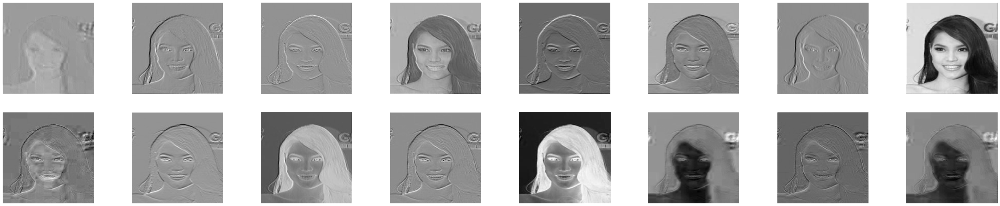

Layer 2


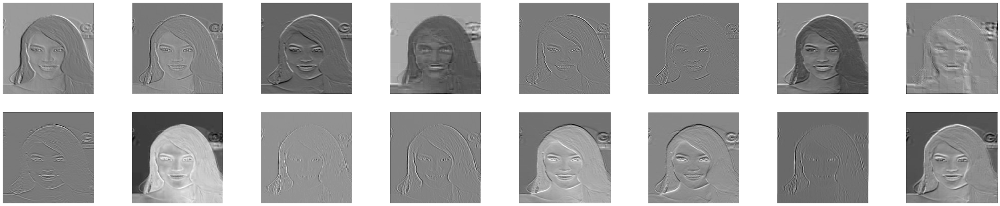

Layer 3


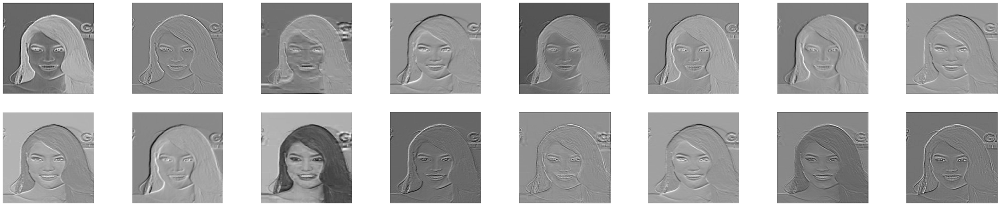

Layer 4


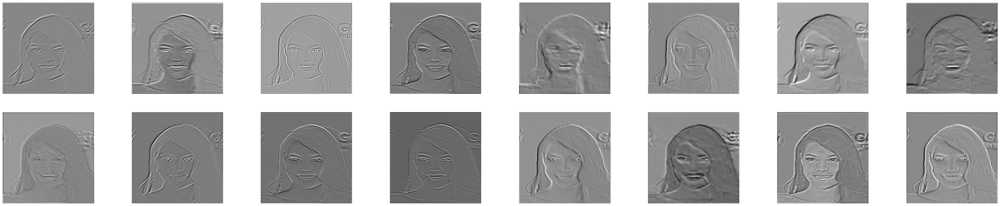

Layer 5


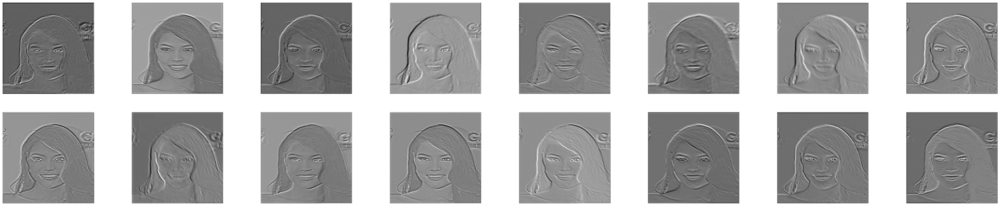

Layer 6


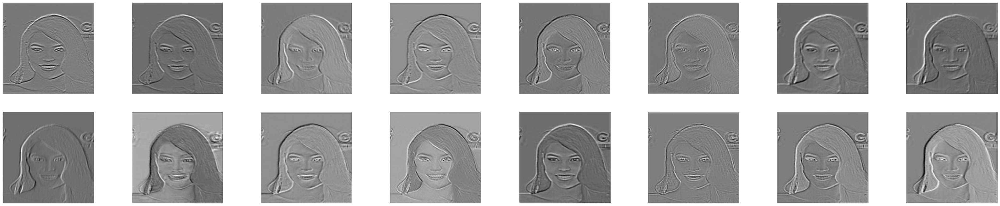

Layer 7


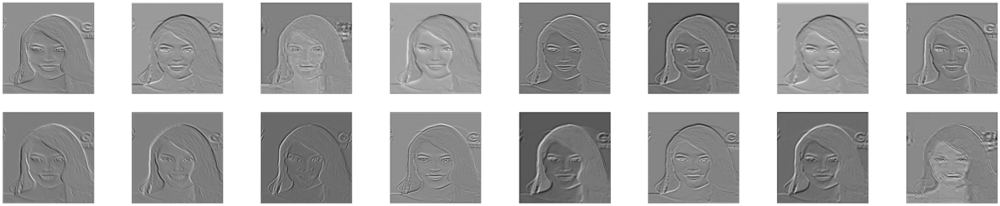

Layer 8


In [ ]:
loadIter = iter(dataMod.train_dataloader())
img, targ = loadIter.next()
imgSample = img[0].unsqueeze(0)
layers = list(model.featureExtractor.children())
convLayers = []
numConv = 0
for child in layers:
    if type(child) == nn.Conv2d:
        numConv +=1
        convLayers.append(child)
    elif type(child)==nn.Sequential:
        for layer in child.children():
            if type(layer) == nn.Conv2d:
                numConv += 1
                convLayers.append(layer)
                
results = [convLayers[0](imgSample)]
for i in range(1, len(convLayers)):
    results.append(convLayers[i](results[-1]))
outputs = results
for numLayer in range(len(outputs)):
    plt.figure(figsize=(50,10))
    layerVis = outputs[numLayer][0,:,:,:]
    layerVis = layerVis.data
    print("Layer", numLayer+1)
    for i, filter in enumerate(layerVis):
        if i == 16:
            break
        plt.subplot(2, 8, i+1)
        plt.imshow(filter, cmap='gray')
        plt.axis('off')
    plt.show()
    plt.close()

In [ ]:
visPreds(preds, 9)

In [ ]:
visFalsePreds(preds)

In [ ]:
getReport(preds)